In [1]:
import warnings
warnings.filterwarnings("ignore")
from IPython.display import display
import pandas as pd
import numpy as np
pd.options.display.max_columns = 100
import osmnx as ox
import folium
import networkx as nx
from networkx.algorithms.community import modularity
from faker import Factory
from geopy.geocoders import Nominatim

**Creating graph of Eyüpsultan:**

In [2]:
address = "Eyüpsultan, İstanbul, Turkey"
istanbul_graph = ox.graph_from_place(address, network_type="walk")
istanbul_graph = nx.Graph(istanbul_graph) 

In [3]:
print("Nodes: ", len(istanbul_graph.nodes()))
print("Edges: ", len(istanbul_graph.edges()))

Nodes:  8298
Edges:  11387


**Finding Comminities:**

In [4]:
communities = nx.algorithms.community.greedy_modularity_communities(istanbul_graph,n_communities=29)
communities[:1]

[frozenset({350231503,
            350231515,
            350231517,
            350231527,
            350231531,
            350231534,
            351909312,
            351909314,
            351909317,
            351909349,
            351909475,
            351909478,
            612022730,
            612022731,
            612022736,
            612022807,
            612022809,
            612022824,
            612022829,
            612022839,
            612022840,
            612022847,
            612022849,
            613348157,
            613348158,
            613348159,
            613348161,
            613348166,
            613348169,
            613348181,
            613348185,
            613348187,
            613348188,
            613348189,
            613348190,
            613348192,
            613348196,
            613348197,
            613348198,
            613348199,
            613348200,
            613348208,
            613348210,
           

**Find coordinates and creating map:**

In [5]:
geolocator = Nominatim(user_agent="my_app")
location = geolocator.geocode(address)
lat, lon = location.latitude, location.longitude

istanbul_map = folium.Map(location=[lat, lon], zoom_start=14)

**Coloring nodes by community separation:**

In [6]:
random_color = Factory.create()

In [7]:
node_colors = {}
for i, community in enumerate(communities):
    for node in community:
        node_colors[node] = i
        
for node in istanbul_graph.nodes(data=True):
    color = random_color.hex_color()
    folium.CircleMarker(
        location=[node[1]['y'], node[1]['x']],
        radius=3,
        color=color,
        fill_color=color,
        fill_opacity=1).add_to(istanbul_map)

for community in communities:
    color = random_color.hex_color()
    for node in community:
        folium.CircleMarker(
            location=[istanbul_graph.nodes[node]['y'], istanbul_graph.nodes[node]['x']],
            radius=3,
            color=color,
            fill_color=color,
            fill_opacity=1).add_to(istanbul_map)

**View the map**

In [8]:
istanbul_map

**Comparison with the districts of Eyüpsultan district**

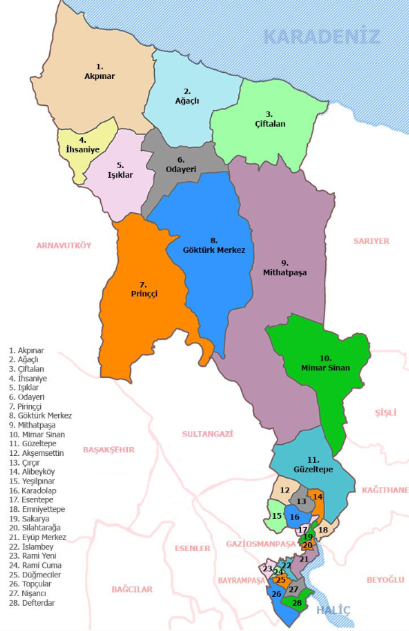

**Modularity score:**

In [9]:
print("Modularity score: ", modularity(istanbul_graph, communities))

Modularity score:  0.9509621188012819
